### <p style="background-color:#627D50;color:#D1CABD;font-size:110%;text-align:center;border-radius:20px 60px;  border: 10px solid #cfcfcf;  padding-top: 10px;  padding-left: 10px;  padding-right: 10px; padding-bottom: 10px;  border-radius: 80px 20px;line-height: 1.2em; margin-bottom: 10px;"> **Projet 6** : Classifiez automatiquement des biens de consommation </p>

<img src="place_marche.png" align="right" alt="Alternative text" />

Vous êtes ***Data Scientist*** au sein de l'entreprise ***Place de marché***, qui souhaite lancer une marketplace e-commerce.

Sur la place de marché, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.

Pour l'instant, l'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs, et est donc **peu fiable**. De plus, le volume des articles est pour l'instant très petit.

Pour une meilleure expérience des vendeurs et des acheteurs, et dans l'optique d'un passage à l'échelle, ***il devient nécessaire d'automatiser cette tâche***.

*************************
- Mentor [**Babou M'BAYE**]()
- Etudiant [**Bourama FANE**](https://www.linkedin.com/in/bourama-fan%C3%A9-7aba41141/)
- Parcours [*Data Scientist*]()
- Ecole [*OpenClassrooms*](https://openclassrooms.com/fr)
- Date : [Juillet 2023]()

<!-- <style>
.right-align {
    text-align: right;
}
</style>

<ul class="right-align">
    <li>Mentor [**Babou M'BAYE**]()</li>
    <li>Etudiant [**Bourama FANE**](https://www.linkedin.com/in/bourama-fan%C3%A9-7aba41141/){:target="_blank"}</li>
    <li>Parcours [*Data Scientiste*]()</li>
</ul>
--- -->

[<font color="#337da4"> <h5> Problématique](#contexte)</h5>
[<font color="#337da4"> <h5> 1. Librairies](#1)</h5>
[<font color="#337da4"> <h5> 2. Approche CNN ](#2)</h5>
> [2.1 Chargement & Exploration](#2.1)<br>
> [2.2 Pretraitement des images](#2.2)<br>
    
[<font color="#337da4"> <h5> 3. Features extraction](#3)</h5>
    
> [3.1 Approche VGG16)](#3.1)<br>
> [3.2 Approche VGG19)](#3.2)<br>
> [3.3 Méthode Xception)](#3.3)<br>
> [3.4 Méthode ResNet50)](#3.4)<br>
    
[<font color="#337da4"> <h5> 4. Classification supervisée](#4)</h5>
   

### <font color="#337da4" id="contexte">Problématique </font>
----------------------------

**Contexte**
*****
L' entreprise **Place de marché souhaite** lancer une marketplace e-commerce. Pour cela, les vendeurs doivent attribuer une catégorie manuellement à leurs produits à partir d'une description et d'une photo.  Afin de passer à une plus large échelle et faciliter le processus, il devient nécessaire d'automatiser cette tâche.

**Mission**
*****
Réaliser une première **étude de faisabilité** d'un moteur de **classification d'articles** basé sur une **image et une description** pour l'**automatisation** de l'attribution de la **catégorie de l'article**.

**Objectifs**
*****
- analyser le jeu de données,
- réaliser :
    > un prétraitement des descriptions des produits<br>
    > une réduction de dimension, <br>
    > un prétraitement des images,<br>
    > puis un clustering. 

La représentation graphique aidera à convaincre que cette approche de modélisation permettra bien de regrouper des produits de même catégorie.

**Contraintes**
*****

Afin d'extraire les features texte, il sera nécessaire de mettre en oeuvre : 
- deux approches de type **bag-of-words**, comptage simple de mots et **Tf-idf** ;<br>
- une approche de type **word/sentence embedding** classique avec Word2Vec (ou Glove ou FastText) ;<br>
- une approche de type word/sentence embedding avec **BERT** ;<br>
- une approche de type word/sentence embedding avec **USE** (Universal Sentence Encoder). 

**Sources**
*****

Pour cette mission, le jeu de données est disponible [ici](https://s3-eu-west-1.amazonaws.com/static.oc-static.com/prod/courses/files/Parcours_data_scientist/Projet+-+Textimage+DAS+V2/Dataset+projet+pre%CC%81traitement+textes+images.zip)

**Livrables :**

Afin de répondre à cette mission, trois notebook seront été réalisés : 
>  ***Notebook 1*** : Analyse des données textuelles (description) et clusterisation <br>
>  ***Notebook 2*** : Analyse des données visuelles (images) et clusterisation<br>
>  ***Notebook 3*** : Combinaison du meilleur modèle de texte et d'image et classification supervisée<br>
>  ***Presentation***: Support de presentation. 

### <font color="#337da4" id="1">1. Librairies </font>
----------------------------

In [1]:
%%time
# Built-in
import os, warnings 
from tqdm import tqdm
# from tqdm.notebook import tqdm

# Data
import numpy as np
import pandas as pd
import sidetable

#Visualisation
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import missingno as msno
import seaborn as sns
from wordcloud import WordCloud
from PIL import Image
import plotly.express as px
# !pip install dataframe_to_image
import dataframe_image as dfi

# NLP
import nltk #/!\ attention use nltk.download('punkt')
from nltk.stem.snowball import EnglishStemmer
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize, wordpunct_tokenize, RegexpTokenizer
from nltk.corpus import words, stopwords


# Cluster
from sklearn.cluster import KMeans, MiniBatchKMeans, DBSCAN
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics import silhouette_score, adjusted_rand_score, silhouette_samples
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Les bibliothèques tensorflow.keras 
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Model  # Import the Model class
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping
from plot_keras_history import show_history, plot_history


# Modele
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.resnet50 import ResNet50

# metrics, classification_repo
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import (silhouette_samples,silhouette_score, adjusted_rand_score,
                             adjusted_mutual_info_score,confusion_matrix, pair_confusion_matrix,
                            ConfusionMatrixDisplay)

# date
from datetime import date, time, datetime, timedelta
from dateutil.relativedelta import relativedelta

# from markdown import Markdown
from IPython.display import display, Markdown
import warnings
warnings.filterwarnings("ignore")

from pandarallel import pandarallel

# Chemin
# imgPath='C:/Users/Fane0763/OpenClassroom/OC Projet 6/Graphs/'
SAVE_IMAGES = True

# Nombre aléatoire pour la reproductibilité des résultats
random_state = 42

class clr:
    start = '\033[93m'+'\033[1m'
    color = '\033[93m'
    end = '\033[0m'
    
# Affichage des valeurs
# pd.set_option('display.max_colwidth', None)

# Police et reglages
font_title = {'family': 'serif', 'color':  '#114b98', 'weight': 'bold', 'size': 16,}
font_title2 = {'family': 'serif', 'color':  '#114b98', 'weight': 'bold', 'size': 12,}
font_title3 = {'family': 'serif', 'color':  '#4F6272', 'weight': 'bold', 'size': 10,}

mycolors = ["black", "hotpink", "b", "#4CAF50"]
AllColors=['#99ff99', '#66b3ff', '#4F6272', '#B7C3F3', '#ff9999', '#ffcc99', '#ff6666', '#DD7596', '#8EB897',
           '#c2c2f0', '#DDA0DD', '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', 
           '#7f7f7f', '#bcbd22', '#17becf', '#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00', '#ffff33',
           '#a65628', '#f781bf', "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#000000"]

%matplotlib inline

CPU times: total: 5.22 s
Wall time: 17.7 s


In [2]:
import sys

def is_colab_environment():
    # Vérifier si le module 'google.colab' est présent dans la liste des modules importés
    return 'google.colab' in sys.modules

# Exemple d'utilisation
if is_colab_environment():
    print("Le code s'exécute dans l'environnement Google Colab.")
else:
    print("Le code s'exécute dans un environnement local.")


Le code s'exécute dans un environnement local.


In [3]:
if is_colab_environment():
    from google.colab import drive
    drive.mount('/content/drive')

In [4]:
# --------------------------------------------------------------------
# Fonction pour créer un dossier s'il n'existe pas déjà
# --------------------------------------------------------------------
def os_make_dir(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)


# --------------------------------------------------------------------
# Fonction pour rejoindre un dossier et un fichier
# --------------------------------------------------------------------
def os_path_join(folder, file):
    """Remplacement pour `os.path.join(folder, file)` sur Windows"""
    return f'{folder}/{file}'

In [5]:
# Configuration des chemins de dossiers pour les différents environnements
if not is_colab_environment():
    # Développement local
    DATA_FOLDER = './Flipkart'
    # Création d'une variable IMG_FOLDER pour le chemin complet du dossier d'images
    IMG_FOLDER = os_path_join(DATA_FOLDER,'Images')
    OUT_FOLDER = f'{DATA_FOLDER}/output'
    IMAGE_FOLDER = f'{DATA_FOLDER}/Images'
    GRAPH_FOLDER= os_path_join(DATA_FOLDER,'Graphs') # graphique pour les diapos
    IMG_FOLDER_PROCESS=os_path_join(DATA_FOLDER,'Images_process') # Images traitées

    
# Définition des chemins de dossiers pour l'environnement Colab
if is_colab_environment():
    # Colaboratory - décommentez les 2 lignes suivantes pour connecter à votre drive
    # from google.colab import drive
    # drive.mount('/content/drive')
    DATA_FOLDER = '/content/drive/MyDrive/OC-Projet-6'
    
    # Création d'une variable IMG_FOLDER pour le chemin complet du dossier d'images
    IMG_FOLDER = os_path_join(DATA_FOLDER,'Flipkart/Images')
    OUT_FOLDER = f'{DATA_FOLDER}/Flipkart/output'
    IMAGE_FOLDER = f'{DATA_FOLDER}/Flipkart/Images'
    GRAPH_FOLDER= os_path_join(DATA_FOLDER,'Flipkart/Graphs') # graphique pour les diapos
    IMG_FOLDER_PROCESS=os_path_join(DATA_FOLDER,'Flipkart/Images_process') # Images traitées

SAVE_IMAGES = True
# imgPath = f'{DATA_FOLDER}/Graphs'
# if not os.path.exists(imgPath[:-1]):
#     os.makedirs(imgPath[:-1])

# Crée les dossiers spécifiés s'ils n'existent pas déjà
os_make_dir(IMAGE_FOLDER)
os_make_dir(OUT_FOLDER)
os_make_dir(GRAPH_FOLDER)  # graphique pour les diapos
os_make_dir(IMG_FOLDER_PROCESS)
imgPath=f'{GRAPH_FOLDER}/'
print(GRAPH_FOLDER)  
os.listdir(DATA_FOLDER)[:5]

./Flipkart/Graphs


['.ipynb_checkpoints',
 'BERT2_features.csv',
 'BERT_features.csv',
 'BOW_features.csv',
 'classification']

In [6]:
def fig_name_cleaning(fig_name: str) -> str:
    """Enlever les caractères interdits dans les filenames ou filepaths"""
    return fig_name.replace(' ', '_').replace(':', '-').replace(
        '.', '-').replace('/', '_').replace('>', 'gt.').replace('<', 'lt.')


def to_png(fig_name=None) -> None:
    """
    Register the current plot figure as an image in a file.
    Must call plt.show() or show image (by calling to_png() as last row in python cell)
    to apply the call 'bbox_inches=tight', to be sure to include the whole title / legend
    in the plot area.
    """

    def get_title() -> str:
        """find current plot title (or suptitle if more than one plot)"""
        if plt.gcf()._suptitle is None:  # noqa
            return plt.gca().get_title()
        else:
            return plt.gcf()._suptitle.get_text()  # noqa

    if SAVE_IMAGES:
        if fig_name is None:
            fig_name = get_title()
        elif len(fig_name) < 9:
            fig_name = f'{fig_name}_{get_title()}'
        fig_name = fig_name_cleaning(fig_name)
        print(f'"{fig_name}.png"')
        plt.gcf().savefig(
            # f'{IMAGE_FOLDER}/{fig_name}.png', bbox_inches='tight')
            imgPath+f'{fig_name}.png', bbox_inches='tight')
        plt.pause(0.01)


In [7]:
# Appel de mes propres functions
from function_cp import *

./Flipkart/Graphs


In [8]:
import psutil
psutil.cpu_count(logical=False)

4

In [9]:
# pandarallel
pandarallel.initialize(progress_bar=True,
                       nb_workers=4,
                       # verbose=1
                       )

INFO: Pandarallel will run on 4 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


### Version des bibliothèques

In [10]:
from platform import python_version

python_version()
print(clr.start+'Versions des bibliothèques utilisées: :.'+clr.end)
print(clr.color+'*' * 39+clr.end)
print(''.join(f'{m.__name__}=={m.__version__}''\n' for m in globals(
).values() if getattr(m, '__version__', None)))

Versions des bibliothèques utilisées: :.
***************************************
numpy==1.24.3
pandas==1.5.3
sidetable==0.9.1
missingno==0.5.2
seaborn==0.12.2
PIL.Image==9.4.0
nltk==3.7
cv2==4.7.0
psutil==5.9.5



#### Configuration

In [11]:
from sklearn import set_config

# pd.set_option('display.max_columns', 200)  # pour afficher toutes les colonnes
# pd.set_option('display.max_rows', 20)  # pour afficher max 10 lignes
# pd.set_option('display.max_colwidth', 100)  # pour afficher toutes la text
# pd.set_option('display.precision', 2)
pd.options.display.float_format = '{:.2f}'.format  # currency, lat,lng

# %matplotlib inline
# sns.set_theme(style="white", context="notebook")
# sns.set_color_codes("pastel")
# sns.set_palette("tab20")

set_config(display='diagram')
# displays HTML representation in a jupyter context

### <font color="#337da4" id="2">2. Approche CNN </font>
----------------------------
<h3>Définition </h3>

[lien](https://keras.io/api/applications/)

[**L'intelligence artificielle**](https://blent.ai/blog/a/cnn-comment-ca-marche) a été témoin d'une croissance monumentale en comblant le fossé entre les capacités des humains et des machines à voir et comprendre des scènes visuelles. Les progrès de la vision par ordinateur avec l'apprentissage profond ont été construits et perfectionnés avec le temps, principalement au moyen d'un algorithme particulier, un réseau de neurones convolutifs.

> - [x] ***Les réseaux neuronaux*** sont un sous-ensemble de l'apprentissage automatique, et ils sont au cœur des algorithmes d'apprentissage profond. Inventés par Yann LeCun durant les années 90, les CNNs sont inspirés des réseaux neuronaux biologiques, et ils sont devenus extrêmement populaires en raison de leurs performances dans les domaines de la vision et plusieurs autres domaines.

> - [x] ***Le réseau de neurones convolutifs (CNN)***  est un type spécialisé de modèle de réseau de neurones conçu pour travailler avec des données d'images bidimensionnelles, bien qu'ils puissent être utilisés avec des données unidimensionnelles et tridimensionnelles. Ces réseaux sont capables d'apprendre à extraire des caractéristiques locales, c'est-à-dire des structures qui se répètent à travers l'image.

<h3>Architecture d'un CNN </h3> 

- [x] [***Couche de convolution (CONV)***](https://datascientest.com/convolutional-neural-network): Le rôle de cette première couche est d'analyser les images fournies en entrée et de détecter la présence d'un ensemble de features. On obtient en sortie de cette couche un ensemble de features maps.

- [x] ***Couche de Pooling (POOL)*** : La couche de Pooling est une opération généralement appliquée entre deux couches de convolution. Celle-ci reçoit en entrée les features maps formées en sortie de la couche de convolution et son rôle est de réduire la taille des images, tout en préservant leurs caractéristiques les plus essentielles. Parmi les plus utilisés, on retrouve le **max-pooling** mentionné précédemment ou encore l'**average pooling** dont l'opération consiste à conserver à chaque pas, la valeur moyenne de la fenêtre de filtre. 

Finalement, on obtient en sortie de cette couche de Pooling, le même nombre de feature maps qu'en entrée mais considérablement compressées.

- [x] ***La couche d'activation ReLU (Rectified Linear Units)*** : Cette couche remplace toutes les valeurs négatives reçues en entrées par des zéros. L'intérêt de ces couches d'activation est de rendre le modèle non linéaire et de ce fait plus complexe.

<img src='https://user.oc-static.com/upload/2018/03/14/15209902891791_RELU.png' width='300px' align='center'>

- [x] ***Couche Fully Connected (FC)*** :  Ces couches sont placées en fin d'architecture de CNN et sont entièrement connectées à tous les neurones de sorties (d'où le terme fully-connected). Après avoir reçu un vecteur en entrée, la couche FC applique successivement une combinaison linéaire puis une fonction d'activation dans le but final de classifier l'input image (voir schéma suivant). Elle renvoie enfin en sortie un vecteur de taille d correspondant au nombre de classes dans lequel chaque composante représente la probabilité pour l'input image d'appartenir à une classe.


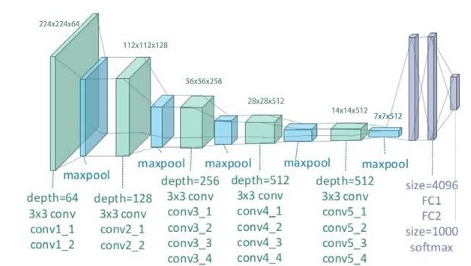



<h3>Exemples de CNNs</h3>

[Diverses architectures de CNNs disponibles](https://perso.esiee.fr/~buzerl/IA/220%20catalogueCNN/catalogueCNN.html) ont joué un rôle clé dans la création d'algorithmes qui alimentent l'IA dans son ensemble. Certains d'entre eux ont été énumérés ci-dessous :

> - [x] ***LeNet*** : est une des premières architectures de CNN développée. Il est composé de sept couches de neurones : trois couches de convolution, une couche de pooling, une couche de normalisation, une couche de sortie fully-connected et une couche de classification. LeNet a été entraîné sur de nombreuses tâches de vision par ordinateur, y compris la classification d'images, la détection d'objets et la reconnaissance de chiffres manuscrits. Il a également été utilisé pour d'autres tâches d'apprentissage automatique, telles que la classification de texte et la classification de signaux audio.

> - [x] ***AlexNet*** : est composé de 5 couches de convolution et 3 couches fully-connected. Il utilise des techniques d'apprentissage profond telles que l'utilisation de couches de pooling, de dropout et de normalisation récurrente.

> - [x] ***VGGNet*** : est une famille de modèles de réseaux de neurones convolutifs de grande profondeur (19 couches) construits par Visual Geometry Group (VGG) à l'Université d'Oxford. Ils ont été introduits dans le papier "Very Deep Convolutional Networks for Large-Scale Image Recognition" en 2014. La VGGNet est composée de 16 (VGG-16) ou 19 (VGG-19) couches de convolution et de pooling, suivies de 3 ou 4 couches de réseaux fully-connected à la fin. Les couches de pooling sont remplacées par des strided convolutions dans certaines versions.

> - [x] ***ResNet*** : ResNet est un réseau de neurones profond (152 couches) composé de plusieurs blocs de modules de raccourcissement de chemin, introduit dans le papier "Deep Residual Learning for Image Recognition" en 2015. Un module de raccourcissement de chemin (shortcut) est composé de plusieurs couches de convolution et de pooling, suivies d'une addition nulle de l'entrée de module à sa sortie. La structure des raccourcissements de chemin permet de résoudre le problème de l'apprentissage profond (vanishing / exploding gradients).


### <font color="#337da4" id="3">3 Extractions des features </font>
Nous allons extraire les features des images. <br>


In [12]:
dfmarket=pd.read_csv('dfcleaned.csv')
dfmarket.head()

,product_name,image,description,cat_code,category1,clean_description,clean_description_ws,_len_description
0,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,4,Home Furnishing,key feature elegance polyester multicolor abst...,key feature elegance polyester multicolor abst...,1420
1,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,0,Baby Care,specification sathiyas cotton bath towel bath ...,specification sathiyas cotton bath towel bath ...,444
2,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,0,Baby Care,key feature eurospa cotton terry face towel se...,key feature eurospa cotton terry face towel se...,1258
3,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,4,Home Furnishing,key feature santosh royal fashion cotton print...,key feature santosh royal fashion cotton print...,858
4,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,4,Home Furnishing,key feature jaipur print cotton floral king si...,key feature jaipur print cotton floral king si...,1197


In [13]:
# Compter le nombre de fichier image
LIST_PHOTOS = [file for file in os.listdir(IMG_FOLDER)]
print(len(LIST_PHOTOS))

1050


#### <font color="#337da4" id="3.1">3.1 Approche VGG16 </font>
-----------------------

[***VGG16***](https://perso.esiee.fr/~buzerl/IA/220%20catalogueCNN/catalogueCNN.html) est un modèle de réseau CNN conçu par ***K. Simonyan et al.*** dans l'équipe Visual Geometry Group de l'Université d'Oxford. En 2014, ce modèle remporta la première place avec une précision de 92,7% sur ImageNet (critère top5). Le nom VGG16 provient des 16 couches qu'il contient dont 13 couches Conv suivies de 3 couches FC. Par rapport au réseau AlexNet, VGG16 a réduit la taille des noyaux assez larges 11x11 des premières couches Conv2D en les remplaçant par plusieurs couches Conv2D de noyaux 3×3 empilés. L'entraînement de VGG16 a pris plusieurs semaines et a nécessité l'utilisation de cartes NVIDIA Titan. ***VGG16 comporte 140 millions de paramètres.***

<img src='https://perso.esiee.fr/~buzerl/IA/_images/VGG16.png'>

On le trouve souvent représenté sous ce format graphique :

<img src='https://perso.esiee.fr/~buzerl/IA/_images/VGG16bis.jpg'>

<img src='https://perso.esiee.fr/~buzerl/IA/_images/ex2.png'>

In [14]:
%%time
# Charger le modèle VGG16 pré-entraîné
base_model = VGG16(weights='imagenet', include_top=True)
model_VGG16 = Model(inputs=base_model.input, outputs=base_model.layers[-2].output)

# update des paramètres
model=model_VGG16
model_name='VGG16'
VGG16_features, processing_time = features_extraction_model(model_name, model, dfmarket)

Processing ...: 100%|███████████████████████████████████████████████████████████| 1050/1050 [05:13<00:00,  3.35image/s]


Extraction de features terminée ...!

Temps de traitement: 5.23 minutes.
CPU times: total: 18min 16s
Wall time: 5min 21s


In [15]:
VGG16_features.shape

(1050, 4096)

In [16]:
# VGG16_features=load_pickle(os_path_join(OUT_FOLDER, f'{model_name}_features.pickle'))
# VGG16_features.head()

In [17]:
def get_dataframe_name(df):
    # Parcours de l'espace de noms global pour trouver le nom correspondant au DataFrame
    for name, obj in globals().items():
        if isinstance(obj, pd.DataFrame) and obj is df:
            return name
        elif isinstance(obj, np.ndarray) and obj is df:
            return name
    return None  # Si le DataFrame n'est pas trouvé


def visu_categories(X_pca, y_true, reduction='PCA', figsize=(15, 6)):
    time1 = time.time()
    num_labels = len(y_true.unique())
    km = KMeans(n_clusters=num_labels, init='k-means++', random_state=random_state)

    if reduction.upper() != 'PCA':
        X_trans = tsne_data(X_pca, n_components=2)
    else:
        X_trans = X_pca

    model = km.fit(X_trans)

    y_pred = km.fit_predict(X_trans)
    ARI = np.round(adjusted_rand_score(y_true, km.labels_), 4)

    X_trans = pd.DataFrame(X_trans)
    time2 = np.round(time.time() - time1, 0)
    print(clr.color + '*' * 120 + clr.end)
    print(clr.start + f'Reduction : {reduction}, ARI :  {ARI}, time : {time2}' + clr.end)
    print(clr.color + '*' * 120 + clr.end)
    print()
    # Créer une figure et spécifier les espacements entre les sous-graphiques
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize, gridspec_kw={'wspace': 0.02})

    # fig = plt.figure(figsize=figsize, gridspec_kw={'wspace': 0.3})
    # ax1 = fig.add_subplot(121)
    # ax2 = fig.add_subplot(122)
    sns.scatterplot(
        ax=ax1, x=X_trans.iloc[:, 0], y=X_trans.iloc[:, 1], hue=pd.Series(y_true))
    ax1.set_title('Représentation en fonction des catégories réelles')
    ax1.legend(loc='best', prop={'size': 11}, )  # loc='upper left', bbox_to_anchor=(-0.5, 1), 'family': 'serif'
    legend1 = ax1.legend(loc='best', prop={'size': 11})
    legend1.get_frame().set_alpha(0)  # Rendre la légende transparente
    sns.scatterplot(
        ax=ax2, x=X_trans.iloc[:, 0], y=X_trans.iloc[:, 1], hue=pd.Series(y_pred), )  # , palette='Set3'
    ax2.set_title('Représentation en fonction des clusters')
    ax2.legend(loc='best', prop={'size': 11}, )
    legend2 = ax1.legend(loc='best', prop={'size': 11})
    legend2.get_frame().set_alpha(0)  # Rendre la légende transparente
    to_png(fig_name='visu_' + reduction.lower() + '_' + get_dataframe_name(X_pca))
    plt.show()
    return y_pred, ARI


def All_extraction_analysis(model_name, model, df_features: pd.DataFrame, data: pd.DataFrame,
                            corresp: list, colname: str = 'image', n_comp=0.99,
                            cat_code: str = 'cat_code', cat_var: str = 'category1'):
    
    df_features.to_csv(f'{model_name}_features.csv', index=False)
    save_pickle(df_features, f'{model_name}_features.pickle', f'{OUT_FOLDER}')

    globals()[model_name+'_features'], c = pca_data(df_features, scaler=StandardScaler(), n_comp=n_comp)
    # y_true = data[cat_var]
    _, ARI = visu_categories(globals()[model_name+'_features'], data[cat_var], reduction='PCA', figsize=(15, 6))
    y_pred, _ = visu_categories(globals()[model_name+'_features'], data[cat_var], reduction='TSNE', figsize=(15, 6))
    plt.pause(0.01)
    ARI, accuracy = matrice_confusion(data, cat_var, cat_code, globals()[model_name+'_features'], corresp)
    to_png(fig_name=f'confusion_{model_name}')
    plt.pause(0.01)
    X_tsne = tsne_data(globals()[model_name+'_features'])
    affiche_images_tsne(X_tsne[:, 0:2], data[colname])
    plt.title(f'Visualisation TSNE des images sur la base des features {model_name}', fontsize=24)
    to_png(fig_name=f'Visualisation_TSNE_images_{model_name}')
    return ARI, accuracy



Shape avant réduction :  (1050, 4096)

Shape après réduction : (1050, 850)
Il faut 850 composantes pour expliquer 99% de la variance du dataset.

************************************************************************************************************************
Reduction : PCA, ARI :  0.4453, time : 2.0
************************************************************************************************************************

"visu_pca_VGG16_features.png"


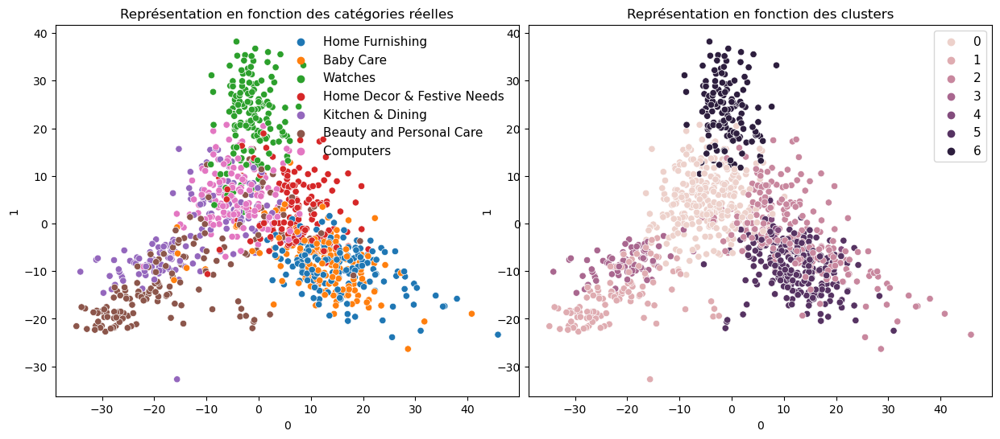

************************************************************************************************************************
Reduction : TSNE, ARI :  0.4577, time : 6.0
************************************************************************************************************************

"visu_tsne_VGG16_features.png"


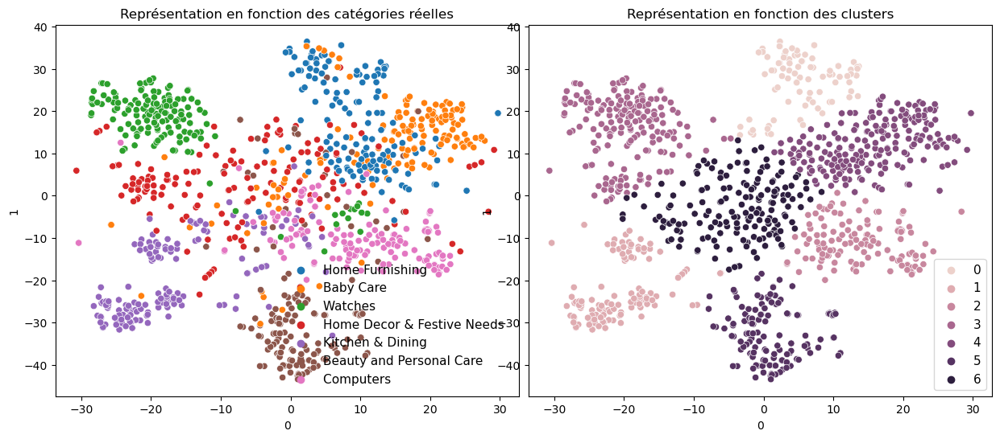

[[ 12   2  26   1   0 109   0]
 [ 30 101   8   0   0  11   0]
 [146   1   1   0   0   2   0]
 [ 16   1 123   0   5   3   2]
 [  0   0  65   0   0  85   0]
 [ 62   2   8  77   0   1   0]
 [ 17   0   0   0   0   0 133]]
**************************************************
Correspondance calculée : [2 1 3 5 3 0 6]
Correspondance          : [2, 1, 3, 5, 4, 0, 6]

**************************************************
[[109   2  12  26   0   1   0]
 [ 11 101  30   8   0   0   0]
 [  2   1 146   1   0   0   0]
 [  3   1  16 123   5   0   2]
 [ 85   0   0  65   0   0   0]
 [  1   2  62   8   0  77   0]
 [  0   0  17   0   0   0 133]]
**************************************************
Métriques de performance par classe:.
**************************************************

              precision    recall  f1-score   support

           0       0.52      0.73      0.60       150
           1       0.94      0.67      0.79       150
           2       0.52      0.97      0.67       150
           3 

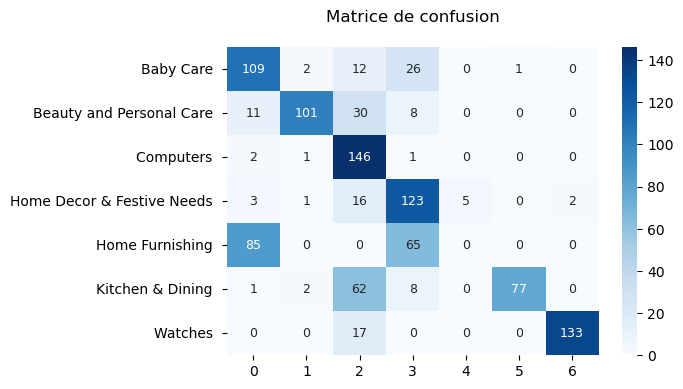

"Visualisation_TSNE_images_VGG16.png"


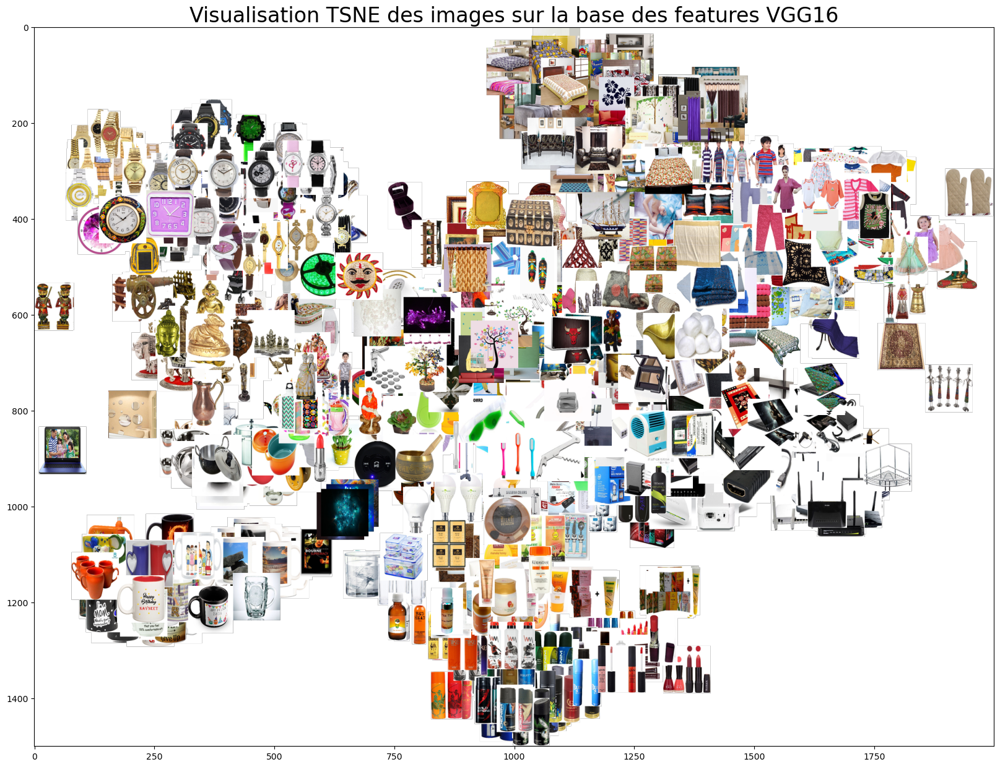

In [18]:
corresp=[2, 1, 3, 5, 4, 0, 6]
ARI, accuracy = All_extraction_analysis(model_name, model, VGG16_features, dfmarket,
                            corresp, colname= 'image', n_comp=0.99)

In [26]:
performances_summary(model_name, ARI, accuracy, processing_time)

,Model,ARI,Accuracy,Time_min
0,VGG16,0.45,0.66,5.02


[***Pickle***](https://www.cours-gratuit.com/tutoriel-python/tutoriel-python-comment-manipuler-les-fichiers-binaires-avec-pickle#:) est utilisé pour sérialiser et désérialiser des structures d'objets Python, également appelées marshalling ou aplatissement. La sérialisation fait référence au processus de conversion d'un objet en mémoire à  un flux d'octets qui peut être stocké sur un disque ou envoyé sur un réseau. Plus tard, ce flux de caractères peut être récupéré et désérialisé en un objet Python. Le dé-sérialisation ne doit pas être confondu avec la compression! Le premier est la conversion d'un objet d'une représentation (données dans la mémoire vive (RAM)) à une autre (texte sur disque), tandis que le second est le processus d'encodage de données avec moins de bits, afin d'économiser de l'espace disque.

Le module pickle implémente un algorithme puissant pour la sérialisation et le dé-sérialisation d'une structure de données implémentée en Python. Le décapage est le processus par lequel la hiérarchie d'un objet est convertie en un flux d'octets.

Il existe plusieurs ***modes d'ouverture*** d'un fichier binaire, à savoir :

  * [x] **wb:** écriture uniquement. Remplace le fichier binaire s'il existe. Sinon, crée un nouveau fichier binaire pour l'écriture.<br>
  * [x] **wb +**: écriture et lecture. Remplace le fichier binaire s'il est fermé. Sinon, crée un nouveau fichier binaire pour l'écriture.<br>
  * [x] **rb**: lecture seule. Définit le pointeur de fichier au début du fichier binaire.<br>
  * [x] **rb +**: lecture et écriture. Définit le pointeur de fichier au début du fichier binaire.<br>

In [27]:
def convert_to_dataframe(data):
    if isinstance(data, pd.DataFrame):
        return data
    elif isinstance(data, np.ndarray):
        return pd.DataFrame(data)
    else:
        raise ValueError("Entrée doit être un DataFrame ou un ndarray.")
        
# convert_to_dataframe(VGG16_features).to_csv('vgg16_features.csv', index=False)
# # save_pickle(VGG16_features, 'vgg16_features.pickle', OUT_FOLDER)

In [28]:
VGG16_features=load_pickle(os_path_join(OUT_FOLDER, f'{model_name}_features.pickle'))

#### Réduction ACP

In [29]:
y_true=dfmarket['category1']

Shape avant réduction :  (1050, 4096)

Shape après réduction : (1050, 850)
Il faut 850 composantes pour expliquer 99% de la variance du dataset.

************************************************************************************************************************
Reduction : PCA, ARI :  0.4453, time : 1.0
************************************************************************************************************************

"visu_pca_VGG16_feat_pca.png"


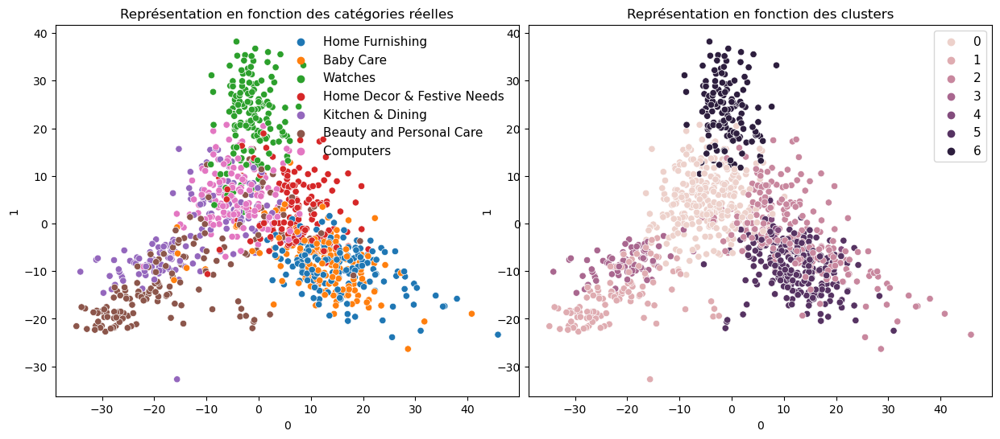

In [30]:
VGG16_feat_pca, c = pca_data(VGG16_features, scaler=StandardScaler(), n_comp=0.99)
y_pred, ARI=visu_categories(VGG16_feat_pca, y_true, reduction='PCA', figsize=(15, 6))

#### Réduction TSNE

************************************************************************************************************************
Reduction : TSNE, ARI :  0.4577, time : 6.0
************************************************************************************************************************

"visu_tsne_VGG16_feat_pca.png"


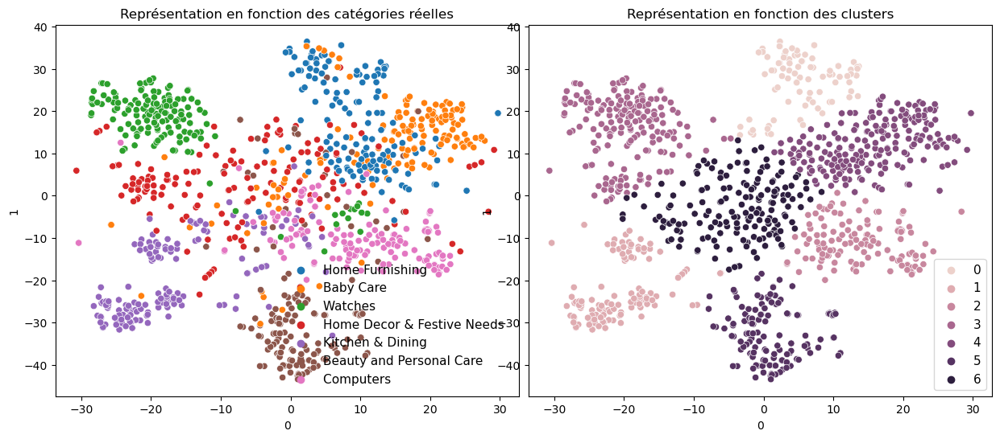

In [31]:
y_pred, ARI=visu_categories(VGG16_feat_pca, y_true, reduction='TSNE', figsize=(15, 6))

#### Matrice de confusion & métriques

[[ 12   2  26   1   0 109   0]
 [ 30 101   8   0   0  11   0]
 [146   1   1   0   0   2   0]
 [ 16   1 123   0   5   3   2]
 [  0   0  65   0   0  85   0]
 [ 62   2   8  77   0   1   0]
 [ 17   0   0   0   0   0 133]]
**************************************************
Correspondance calculée : [2 1 3 5 3 0 6]
Correspondance          : [2, 1, 3, 5, 4, 0, 6]

**************************************************
[[109   2  12  26   0   1   0]
 [ 11 101  30   8   0   0   0]
 [  2   1 146   1   0   0   0]
 [  3   1  16 123   5   0   2]
 [ 85   0   0  65   0   0   0]
 [  1   2  62   8   0  77   0]
 [  0   0  17   0   0   0 133]]
**************************************************
Métriques de performance par classe:.
**************************************************

              precision    recall  f1-score   support

           0       0.52      0.73      0.60       150
           1       0.94      0.67      0.79       150
           2       0.52      0.97      0.67       150
           3 

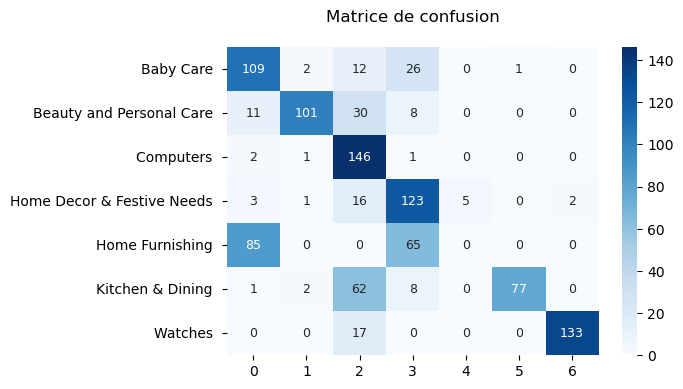

"confusion_VGG16.png"


<Figure size 640x480 with 0 Axes>

In [32]:
corresp=[2, 1, 3, 5, 4, 0, 6]
matrice_confusion(dfmarket,'category1',"cat_code", VGG16_feat_pca, corresp=corresp)
to_png(fig_name='confusion_VGG16')

"Visualisation_des_produits_sur_TSNE_sur_la_base_des_features_VGG16.png"


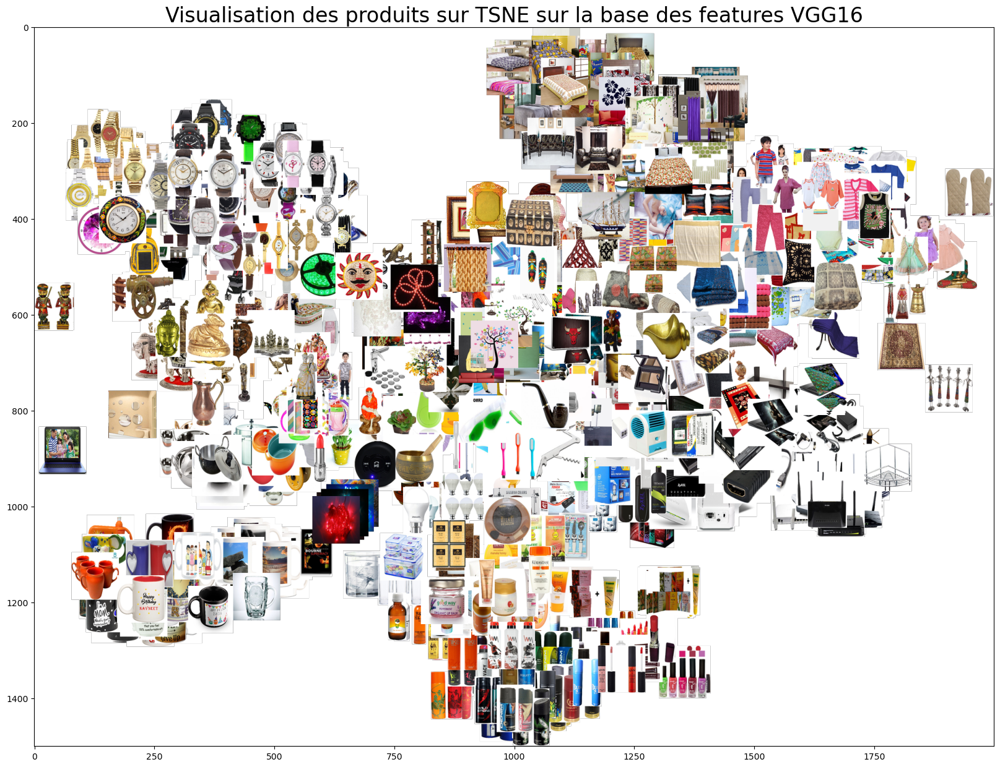

In [33]:
X_tsne=tsne_data(VGG16_feat_pca)
affiche_images_tsne(X_tsne[:, 0:2], dfmarket['image'])
plt.title('Visualisation des produits sur TSNE sur la base des features VGG16', fontsize=24)
to_png()

In [34]:
dfmarket['image_path']=IMG_FOLDER+'/'+dfmarket['image']
dfmarket[['image_path','image','cat_code','category1']].head()

,image_path,image,cat_code,category1
0,./Flipkart/Images/55b85ea15a1536d46b7190ad6fff...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,4,Home Furnishing
1,./Flipkart/Images/7b72c92c2f6c40268628ec5f14c6...,7b72c92c2f6c40268628ec5f14c6d590.jpg,0,Baby Care
2,./Flipkart/Images/64d5d4a258243731dc7bbb1eef49...,64d5d4a258243731dc7bbb1eef49ad74.jpg,0,Baby Care
3,./Flipkart/Images/d4684dcdc759dd9cdf41504698d7...,d4684dcdc759dd9cdf41504698d737d8.jpg,4,Home Furnishing
4,./Flipkart/Images/6325b6870c54cd47be6ebfbffa62...,6325b6870c54cd47be6ebfbffa620ec7.jpg,4,Home Furnishing


#### <font color="#337da4" id="3.2">3.2 Approche VGG19 </font>
-----------------------

- Le modèle VGG19 est un réseau neuronal convolutif dont la profondeur est de 19 couches. Il a été construit et entraîné par K. Simonyan et A. Zisserman à l'université d'Oxford en 2014. 
- Le réseau VGG-19 est entraîné en utilisant plus d'un million d'images de la base de données ImageNet. Il a été entraîné sur des images colorées de 224x224 pixels. Naturellement, vous pouvez importer le modèle avec les poids formés par ImageNet. 
- Ce réseau pré-entraîné peut classifier jusqu'à 1000 objets.

[Source](https://towardsdatascience.com/how-to-use-a-pre-trained-model-vgg-for-image-classification-8dd7c4a4a517)

In [19]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.models import Model


# Charger le modèle VGG19 pré-entraîné
base_model = VGG19(weights='imagenet', include_top=True)
model_VGG19 = Model(inputs=base_model.input, outputs=base_model.layers[-2].output)


# update des paramètres
model=model_VGG19
model_name='VGG19'
VGG19_features, processing_time = features_extraction_model(model_name, model, dfmarket)

# # Liste pour stocker les vecteurs de caractéristiques
# pict_vectors = []

# # Boucle avec barre de progression
# for image_num in tqdm(range(dfmarket.shape[0]), desc="Processing images", unit="image"):
#     image = load_img(os_path_join(IMG_FOLDER, dfmarket.image.iloc[image_num]), target_size=(224, 224))
#     image = img_to_array(image)

#     image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
#     # Préparer l'image pour le modèle VGG19
#     image = preprocess_input(image)

#     features = model.predict(image, verbose=0, use_multiprocessing=True)
#     pict_vectors.append(features.flatten())
#     print('Extraction de features terminée ...')

# # Créer un DataFrame à partir des vecteurs
# vgg19_features = pd.DataFrame(pict_vectors)


Processing ...: 100%|███████████████████████████████████████████████████████████| 1050/1050 [05:38<00:00,  3.10image/s]


Extraction de features terminée ...!

Temps de traitement: 5.64 minutes.


In [20]:
VGG19_features.shape

(1050, 4096)

Shape avant réduction :  (1050, 4096)

Shape après réduction : (1050, 846)
Il faut 846 composantes pour expliquer 99% de la variance du dataset.

************************************************************************************************************************
Reduction : PCA, ARI :  0.4256, time : 1.0
************************************************************************************************************************

"visu_pca_VGG19_features.png"


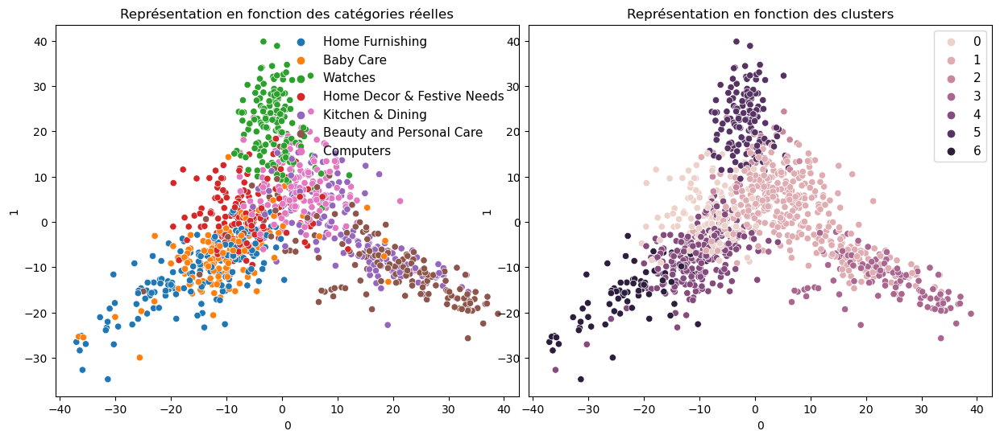

************************************************************************************************************************
Reduction : TSNE, ARI :  0.4442, time : 6.0
************************************************************************************************************************

"visu_tsne_VGG19_features.png"


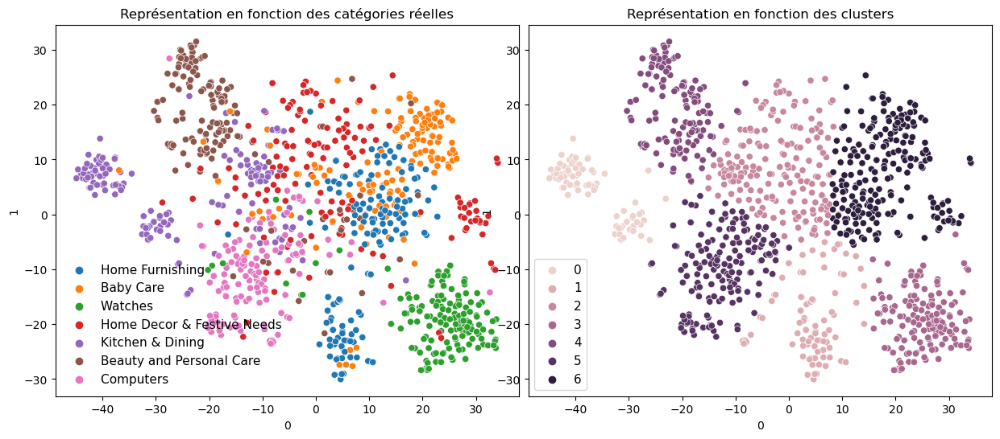

[[  9  17   0   1 114   0   9]
 [  6  34   0 100   9   0   1]
 [  1 118  24   1   5   1   0]
 [108  21   0   0  15   3   3]
 [  2   3   0   0  88   0  57]
 [  4 144   0   1   1   0   0]
 [  3  13   0   0   0 134   0]]
**************************************************
Correspondance calculée : [3 5 2 1 0 6 4]
Correspondance          : [3, 5, 2, 1, 0, 6, 4]

**************************************************
[[114   1   0   9   9  17   0]
 [  9 100   0   6   1  34   0]
 [  5   1  24   1   0 118   1]
 [ 15   0   0 108   3  21   3]
 [ 88   0   0   2  57   3   0]
 [  1   1   0   4   0 144   0]
 [  0   0   0   3   0  13 134]]
**************************************************
Métriques de performance par classe:.
**************************************************

              precision    recall  f1-score   support

           0       0.49      0.76      0.60       150
           1       0.97      0.67      0.79       150
           2       1.00      0.16      0.28       150
           3 

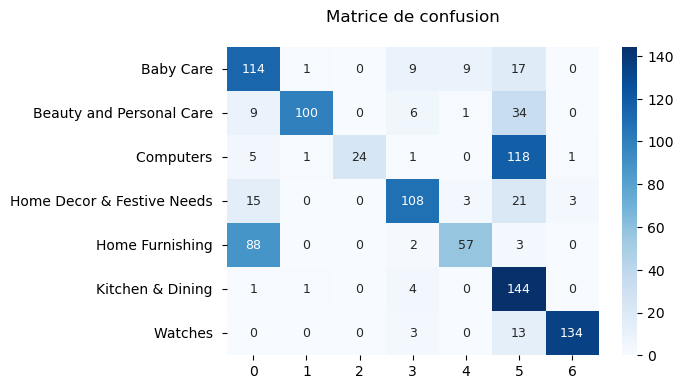

"Visualisation_TSNE_images_VGG19.png"


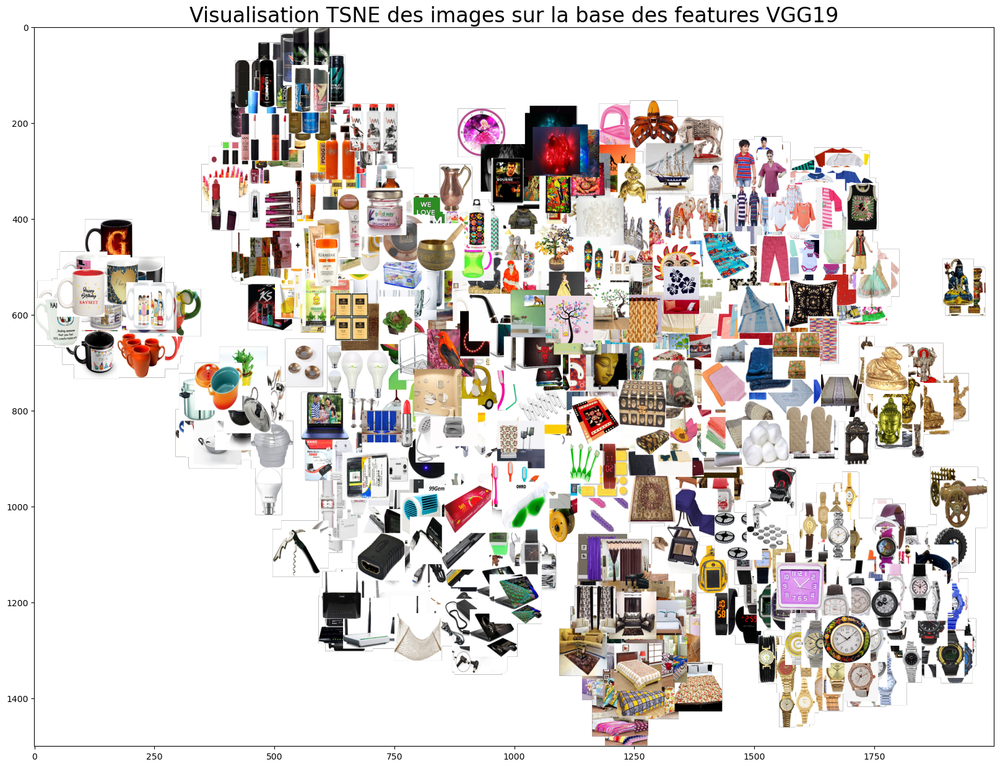

In [21]:
corresp=[3, 5, 2, 1, 0, 6, 4]
# corresp=[3 5 2 1 0 6 4]
ARI, accuracy = All_extraction_analysis(model_name, model, VGG19_features, dfmarket, 
                                        corresp=corresp, colname= 'image', n_comp=0.99)

In [22]:
performances_summary(model_name, ARI, accuracy, processing_time)

,Model,ARI,Accuracy,Time_min
0,VGG19,0.43,0.65,5.64


#### <font color="#337da4" id="3.3">3.3 Méthode Xception </font>
-----------------------

* [x] **Inception**, est une architecture de réseau de neurones convolutifs profonds conçue pour la tâche de classification d'images. Elle a été proposée par François Chollet en 2016 comme une extension de l'architecture Inception.

* [x] **Xception** créé par Google en 2017 signifie 'version extrême d'Inception' et constitue une modification de Inception. 
- Avec une convolution séparable en profondeur modifiée, elle est même meilleure qu'Inception-v3 (également par Google, 1er prix à l'ILSVRC 2015) pour les jeux de données ImageNet ILSVRC et JFT.

* [x] **Le principe fondamental de l'architecture Xception** repose sur la séparation des opérations de convolution en deux étapes distinctes : la première pour capturer les interactions spatiales entre les canaux de l'image (opération appelée "Depthwise Separable Convolution"), et la seconde pour combiner ces informations spatiales (opération appelée "Pointwise Convolution"). Cela permet de réduire le nombre de paramètres et de calculs tout en conservant la capacité de modélisation.

Voici un aperçu de la structure de l'architecture Xception :

- * [x] **Entrée:** Une image en entrée de taille fixe (par exemple, **299x299** pixels).

- * [x] **Première couche de convolution:** Une couche de convolution standard pour extraire les caractéristiques de base de l'image.

- * [x] **Blocs de convolution en profondeur (Depthwise Separable Convolution)**: Cette partie est la caractéristique centrale de Xception. Chaque bloc se compose des étapes suivantes :

> - [x] a. **Depthwise Convolution**: La convolution est appliquée individuellement à chaque canal d'entrée. Cela capture les interactions spatiales entre les canaux.

> - [x] b. **Pointwise Convolution**: Une convolution 1x1 est utilisée pour combiner les informations spatiales précédemment capturées.

> - [x] c. **Ajout de résidus et de connexions en cascade**: Des connexions résiduelles sont ajoutées pour faciliter l'entraînement en profondeur, et des connexions en cascade sont utilisées pour créer un flux d'information plus riche à travers les couches.

- * [x] **Max Pooling et Classification**: Des couches de max pooling sont généralement utilisées pour réduire progressivement la taille spatiale des caractéristiques, suivi par des couches de classification, comme des couches entièrement connectées, pour produire les sorties de classe.

L'architecture Xception vise à combiner les avantages des architectures Inception (efficacité dans la représentation) et des architectures de type ResNet (facilité d'entraînement en profondeur). En séparant les convolutions en opérations distinctes, elle réduit la complexité tout en maintenant la performance.

[Source](https://towardsdatascience.com/review-xception-with-depthwise-separable-convolution-better-than-inception-v3-image-dc967dd42568)

In [23]:
%%time
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.xception import preprocess_input
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.models import Model

# Charger le modèle Xception pré-entraîné
base_model = Xception(weights='imagenet', include_top=True)
model_Xception = Model(inputs=base_model.input, outputs=base_model.layers[-2].output)

# update des paramètres
model=model_Xception
model_name='Xception'
Xception_features, processing_time = features_extraction_model(model_name, model, dfmarket, IMGSIZE = 299)
Xception_features.shape

Processing ...: 100%|███████████████████████████████████████████████████████████| 1050/1050 [05:19<00:00,  3.29image/s]


Extraction de features terminée ...!

Temps de traitement: 5.32 minutes.
CPU times: total: 22min 31s
Wall time: 5min 23s


(1050, 2048)

Shape avant réduction :  (1050, 2048)

Shape après réduction : (1050, 762)
Il faut 762 composantes pour expliquer 99% de la variance du dataset.

************************************************************************************************************************
Reduction : PCA, ARI :  0.4772, time : 1.0
************************************************************************************************************************

"visu_pca_Xception_features.png"


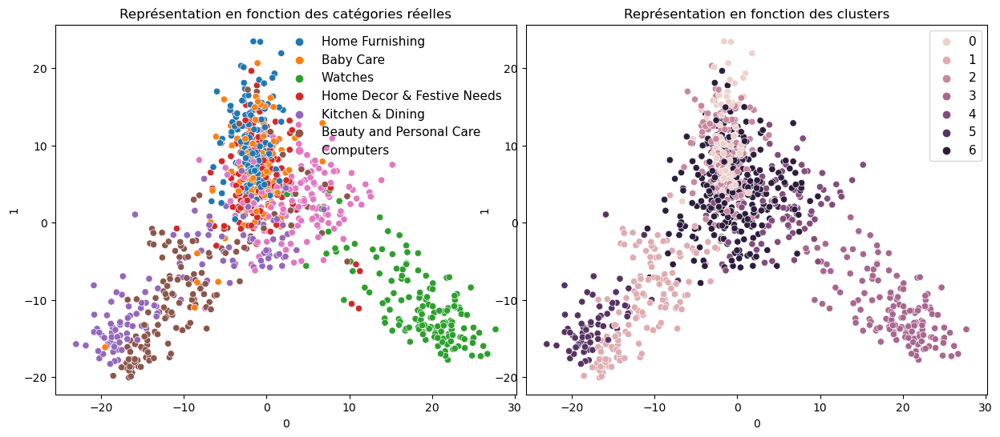

************************************************************************************************************************
Reduction : TSNE, ARI :  0.5732, time : 6.0
************************************************************************************************************************

"visu_tsne_Xception_features.png"


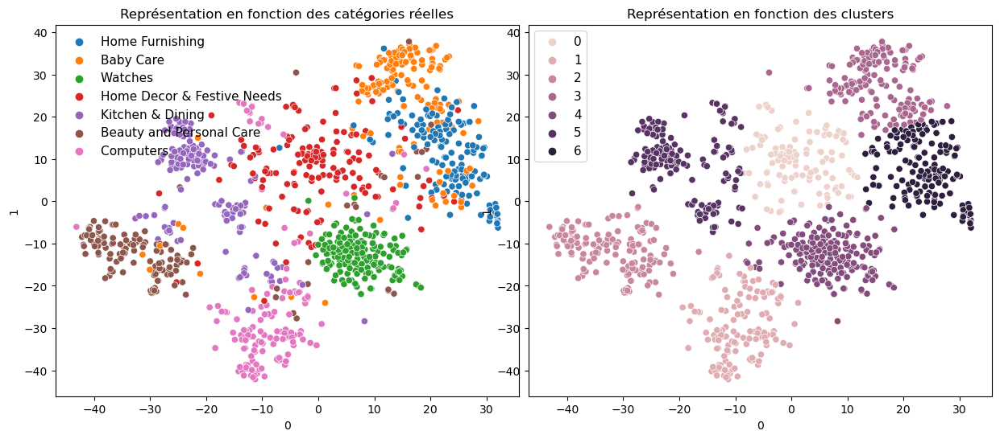

[[ 11   3 109   0   0   1  26]
 [  1 120   5   0   2   0  22]
 [  0   1   2   0 100   0  47]
 [  4   2   2   4   0   0 138]
 [ 76   0  66   0   0   0   8]
 [  0   7   0   0   0  75  68]
 [  0   0   0 143   0   0   7]]
**************************************************
Correspondance calculée : [4 1 0 6 2 5 3]
Correspondance          : [4, 1, 0, 6, 2, 5, 3]

**************************************************
[[109   3   0  26  11   1   0]
 [  5 120   2  22   1   0   0]
 [  2   1 100  47   0   0   0]
 [  2   2   0 138   4   0   4]
 [ 66   0   0   8  76   0   0]
 [  0   7   0  68   0  75   0]
 [  0   0   0   7   0   0 143]]
**************************************************
Métriques de performance par classe:.
**************************************************

              precision    recall  f1-score   support

           0       0.59      0.73      0.65       150
           1       0.90      0.80      0.85       150
           2       0.98      0.67      0.79       150
           3 

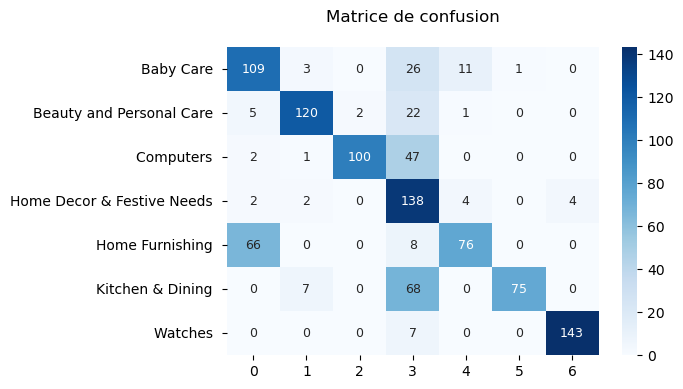

"Visualisation_TSNE_images_Xception.png"


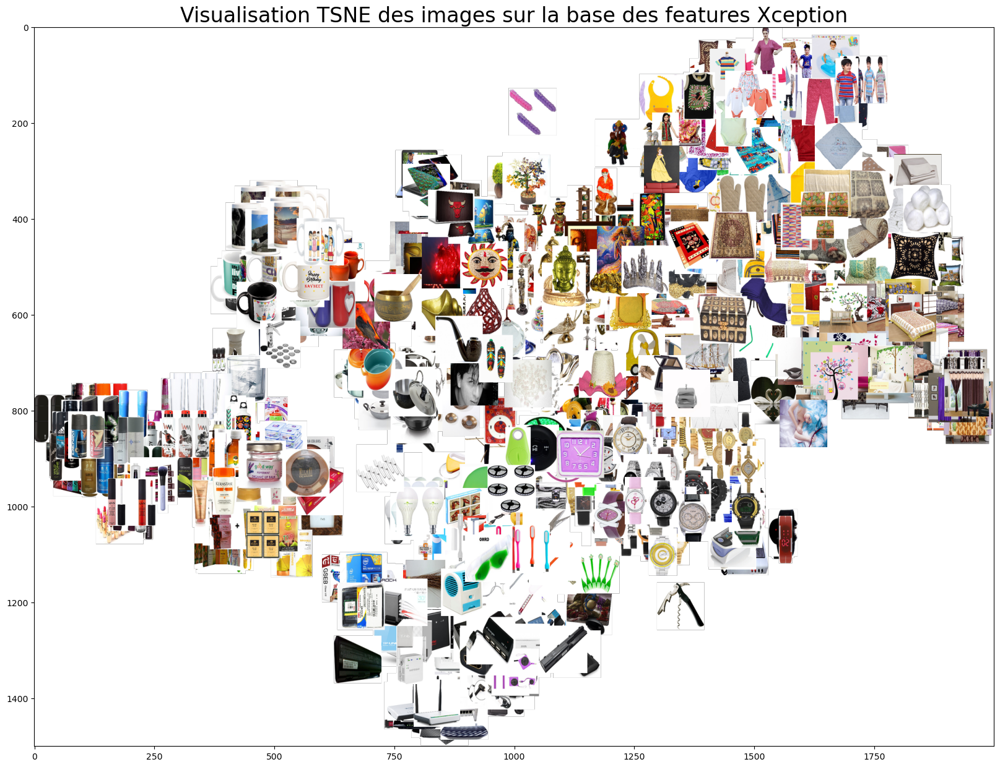

In [24]:
corresp=[4, 1, 0, 6, 2, 5, 3]
ARI, accuracy = All_extraction_analysis(model_name, model, Xception_features, dfmarket,
                            corresp=corresp, colname= 'image', n_comp=0.99)

In [25]:
performances_summary(model_name, ARI, accuracy, processing_time)

,Model,ARI,Accuracy,Time_min
0,Xception,0.48,0.72,5.32


#### <font color="#337da4" id="3.4">3.4 Méthode ResNet50 </font>
-----------------------

*En 2015*, ***Kaiming He et al.*** de Microsoft Research ont atteint d'excellentes performances sur ImageNet avec les réseaux résiduels (Residual Network or ResNet). Les réseaux profonds sont confrontés à deux problèmes importants :

- [x] *Vanishing gradient* : dans certains cas, notamment lorsque plus de couches sont présentes, le gradient des couches inférieures se compose de valeurs infimes qui empêchent les paramètres de ces couches d'évoluer de manière significatives.

- [x] *Accuracy saturation* : ajouter plus de couches à un modèle fonctionnel produit un réseau avec une erreur plus importante.

Pour contrecarrer ces problèmes, ResNet met en place entre les couches des raccourcis qui permettent à l'information de l'étage **n-2** d'atteindre directement l'étage n en se recombinant avec la sortie de l'étage **n-1** :

<img src='https://perso.esiee.fr/~buzerl/IA/_images/residual.png'>

Les défauts induits par l’utilisation de trop nombreuses couches ayant diminué, on peut maintenant se permettre d’augmenter le nombre de couches dans le réseau. Voici une comparaison entre **VGG16** et l’architecture **ResNet34** avec les raccourcis symbolisés par des flèches :

<img src='https://perso.esiee.fr/~buzerl/IA/_images/resnet.png'>

Suite à cette découverte, **la profondeur des réseaux** a dépassé rapidement une centaine de couches pour atteindre aujourd’hui jusqu’à **500 couches**.

Dans Keras, le modèle ***ResNet50*** est disponible et préentrainé :
***ResNet50*** contient **25 millions de paramètres** ce qui représente une économie par rapport aux **140 millions de paramètres de VGG16**.

In [26]:
%%time
import os
import numpy as np
import pandas as pd
from tqdm import tqdm


from tensorflow.keras.models import Model

# Charger le modèle ResNet50 pré-entraîné
base_model = ResNet50(weights='imagenet', include_top=True)
model_ResNet50 = Model(inputs=base_model.input, outputs=base_model.layers[-2].output)

# update des paramètres
model=model_ResNet50
model_name='ResNet50'
ResNet50_features, processing_time = features_extraction_model(model_name, model, dfmarket)
ResNet50_features.shape

Processing ...: 100%|███████████████████████████████████████████████████████████| 1050/1050 [05:20<00:00,  3.27image/s]


Extraction de features terminée ...!

Temps de traitement: 5.35 minutes.
CPU times: total: 15min 32s
Wall time: 5min 26s


(1050, 2048)

Shape avant réduction :  (1050, 2048)

Shape après réduction : (1050, 786)
Il faut 786 composantes pour expliquer 99% de la variance du dataset.

************************************************************************************************************************
Reduction : PCA, ARI :  0.5156, time : 2.0
************************************************************************************************************************

"visu_pca_ResNet50_features.png"


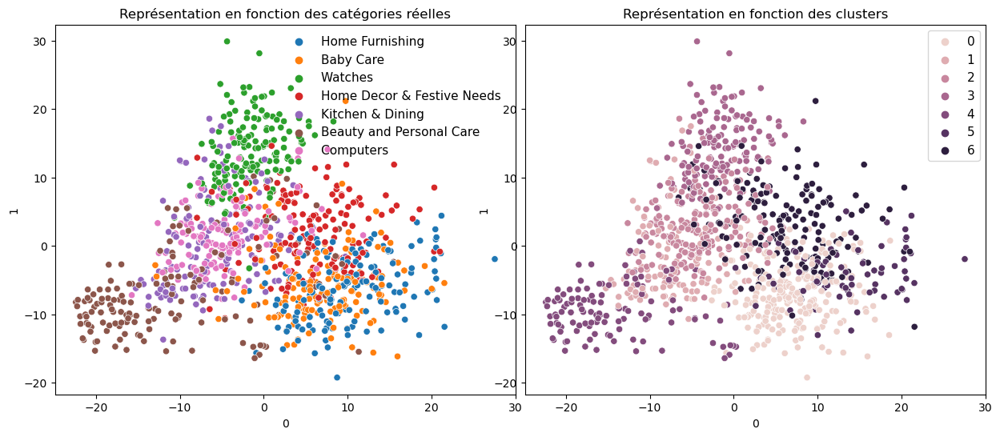

************************************************************************************************************************
Reduction : TSNE, ARI :  0.4762, time : 8.0
************************************************************************************************************************

"visu_tsne_ResNet50_features.png"


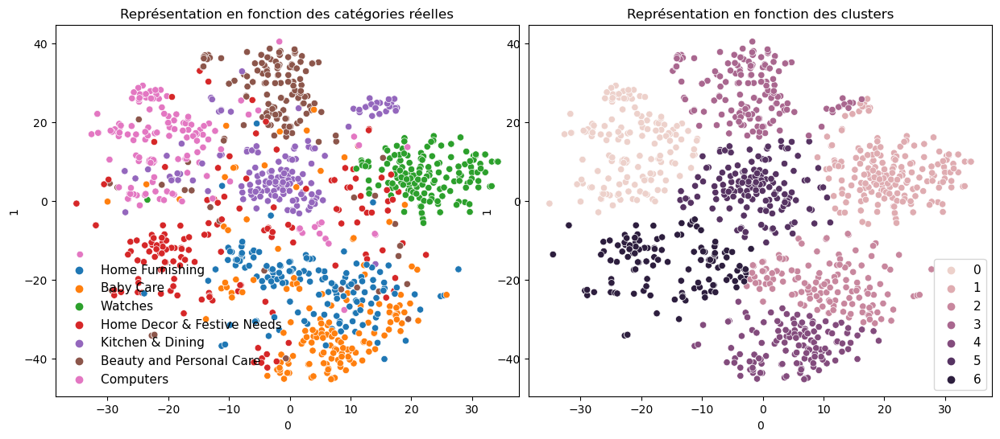

[[115   6   6   1   2  10  10]
 [ 11  11  12   1 107   1   7]
 [  5   1 135   1   2   0   6]
 [ 15   1  11   2   3   3 115]
 [ 85   0   2   0   0  57   6]
 [  2 105  25   0   2   0  16]
 [  0   0  11 136   0   0   3]]
**************************************************
Correspondance calculée : [0 5 2 6 1 4 3]
Correspondance          : [0, 5, 2, 6, 1, 4, 3]

**************************************************
[[115   2   6  10  10   6   1]
 [ 11 107  12   7   1  11   1]
 [  5   2 135   6   0   1   1]
 [ 15   3  11 115   3   1   2]
 [ 85   0   2   6  57   0   0]
 [  2   2  25  16   0 105   0]
 [  0   0  11   3   0   0 136]]
**************************************************
Métriques de performance par classe:.
**************************************************

              precision    recall  f1-score   support

           0       0.49      0.77      0.60       150
           1       0.92      0.71      0.80       150
           2       0.67      0.90      0.77       150
           3 

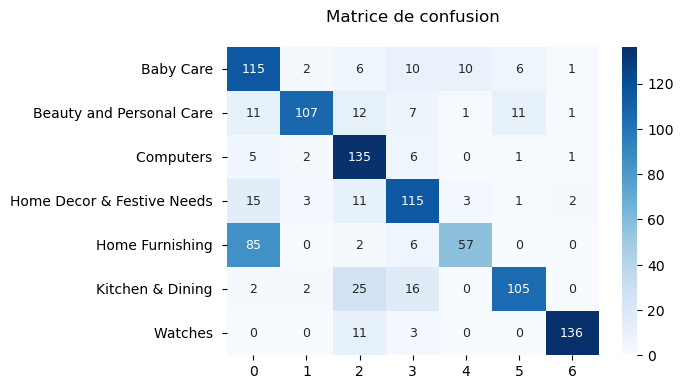

"Visualisation_TSNE_images_ResNet50.png"


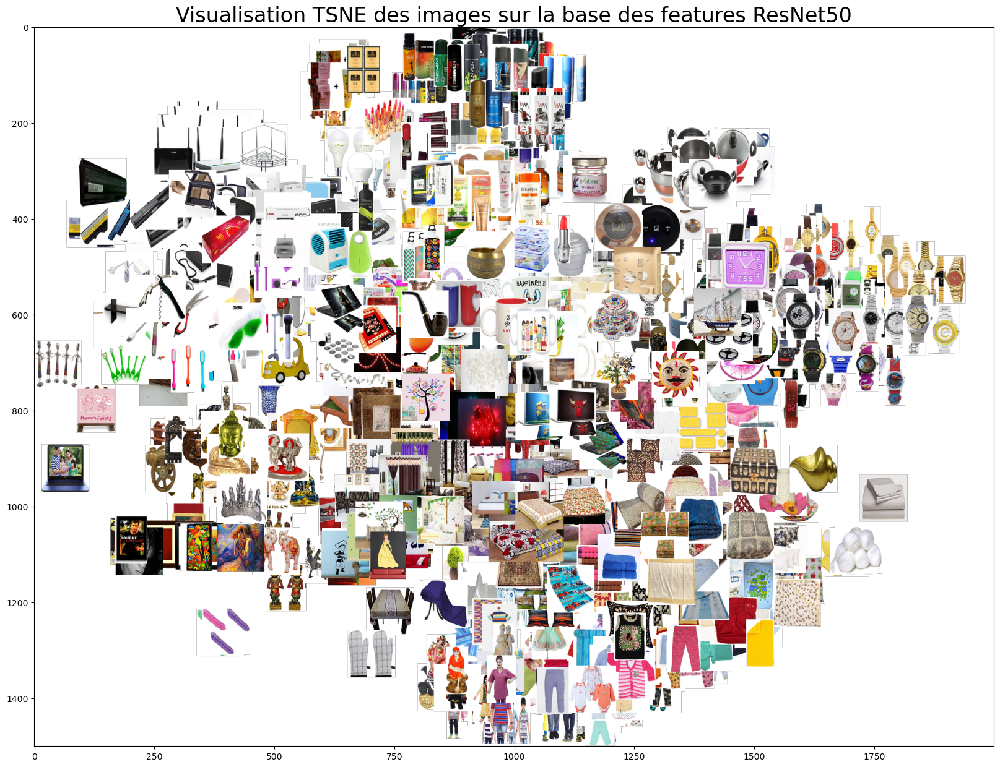

In [27]:
corresp=[0, 5, 2, 6, 1, 4, 3]
ARI, accuracy = All_extraction_analysis(model_name, model, ResNet50_features, dfmarket,
                            corresp=corresp, colname= 'image', n_comp=0.99)

In [28]:
performances_summary(model_name, ARI, accuracy, processing_time)

,Model,ARI,Accuracy,Time_min
0,ResNet50,0.52,0.73,5.35


### <font color="#337da4" id="4">4 Classification supervisée </font>
----------------------------

##### <font color="#337da4"> Split Train / Validation / Test </font>
----------------------------

Nous allons comme d'habitude commencer par la préparation des jeux de données permettant d'entrainer notre réseau. 

Pour celà nous allons splitter dans un ratio **60/20/20%** les images permettant l'apprentissage et les images permettant la validation et le test.

Le modèle va donc apprendre sur le jeu d'entrainement puis valider les prédictions sur le jeu de validation.
A noter que ces deux jeux de données sont labellisés : c'est à dire que l'on connait les classes auquelles appartiennent les images

Le schéma suivant donne une illustration de la répartition entre le jeu d'entrainement et le jeu de validation: 


In [29]:
dfmarket.head()

,product_name,image,description,cat_code,category1,clean_description,clean_description_ws,_len_description
0,Elegance Polyester Multicolor Abstract Eyelet ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,4,Home Furnishing,key feature elegance polyester multicolor abst...,key feature elegance polyester multicolor abst...,1420
1,Sathiyas Cotton Bath Towel,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,0,Baby Care,specification sathiyas cotton bath towel bath ...,specification sathiyas cotton bath towel bath ...,444
2,Eurospa Cotton Terry Face Towel Set,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,0,Baby Care,key feature eurospa cotton terry face towel se...,key feature eurospa cotton terry face towel se...,1258
3,SANTOSH ROYAL FASHION Cotton Printed King size...,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,4,Home Furnishing,key feature santosh royal fashion cotton print...,key feature santosh royal fashion cotton print...,858
4,Jaipur Print Cotton Floral King sized Double B...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,4,Home Furnishing,key feature jaipur print cotton floral king si...,key feature jaipur print cotton floral king si...,1197


In [30]:
# Pour mélanger les images, classées initalement par classe
data = dfmarket.sample(frac=1, random_state=42).reset_index(drop=True)
data['image_path']=IMG_FOLDER+'/'+data['image']
data.head()

,product_name,image,description,cat_code,category1,clean_description,clean_description_ws,_len_description,image_path
0,Zyxel PLA-4205,833a87b0af3b84fe246d2ebf271af177.jpg,Buy Zyxel PLA-4205 only for Rs. 8100 from Flip...,2,Computers,buy zyxel pla flipkart com genuine product day...,buy zyxel pla only for from flipkart com only ...,141,./Flipkart/Images/833a87b0af3b84fe246d2ebf271a...
1,Philips 9.5 W LED B22 3000K A55 IND Bulb,55195de3873fffaa9e37b041533d7305.jpg,Buy Philips 9.5 W LED B22 3000K A55 IND Bulb f...,5,Kitchen & Dining,buy philip led ind bulb online philip led ind ...,buy philip led ind bulb for online philip led ...,211,./Flipkart/Images/55195de3873fffaa9e37b041533d...
2,Lapguard Lenovo IdeaPad V470 6 Cell Laptop Bat...,44b963eb856b4831dfdd21b666593c95.jpg,Lapguard Lenovo IdeaPad V470 6 Cell Laptop Bat...,2,Computers,lapguard lenovo ideapad cell laptop battery pr...,lapguard lenovo ideapad cell laptop battery pr...,1674,./Flipkart/Images/44b963eb856b4831dfdd21b66659...
3,Anna Andre Paris Set of Dark Fire & Numero 1 D...,98ad5b99ad96695568d8f143b11ab740.jpg,Flipkart.com: Buy Anna Andre Paris Set of Dark...,1,Beauty and Personal Care,flipkart com buy anna andre paris set dark fir...,flipkart com buy anna andre paris set dark fir...,212,./Flipkart/Images/98ad5b99ad96695568d8f143b11a...
4,"Lenco Bdblue Tango Analog Watch - For Men, Boys",29b1ca231e10d5269516b80bf9d0dffc.jpg,"Lenco Bdblue Tango Analog Watch - For Men, Bo...",6,Watches,lenco bdblue tango analog watch men boy buy le...,lenco bdblue tango analog watch for men boy bu...,323,./Flipkart/Images/29b1ca231e10d5269516b80bf9d0...


In [31]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Chemin vers le dossier contenant toutes les images
data_dir = IMG_FOLDER
# Chemin vers le dossier du jeu de données
dataset_dir = DATA_FOLDER

train_dir = os_path_join(dataset_dir, 'train') 
validation_dir = os_path_join(dataset_dir, 'validation')
test_dir = os_path_join(dataset_dir, 'test')


for folder in [train_dir, validation_dir, test_dir]:
    try:
        shutil.rmtree(folder)
        print(f"Le dossier '{folder}' et son contenu ont été supprimés avec succès.")
    except OSError as e:
        print(f"{e}")


Le dossier './Flipkart/train' et son contenu ont été supprimés avec succès.
Le dossier './Flipkart/validation' et son contenu ont été supprimés avec succès.
Le dossier './Flipkart/test' et son contenu ont été supprimés avec succès.


In [32]:
os_make_dir(train_dir)
os_make_dir(validation_dir)
os_make_dir(test_dir)

In [33]:
# Diviser les données en ensembles d'entraînement, de validation et de test
temp_x, test_data, temp_y, y_test = train_test_split(data[['image_path','image','cat_code','category1']],
                                                          data[['cat_code']], test_size=0.2,
                                                          random_state=random_state)
train_data, val_data, y_train, y_val = train_test_split(temp_x, temp_y, test_size=0.1, random_state=random_state)
train_data.head(3)

,image_path,image,cat_code,category1
37,./Flipkart/Images/7e11aaffb1d08f8091ea94598f78...,7e11aaffb1d08f8091ea94598f7865aa.jpg,3,Home Decor & Festive Needs
269,./Flipkart/Images/bcb8e456728013a90ba66ab3b1b7...,bcb8e456728013a90ba66ab3b1b783ad.jpg,2,Computers
721,./Flipkart/Images/dfbd96036cbc28566e964cff04b5...,dfbd96036cbc28566e964cff04b5b3a8.jpg,4,Home Furnishing


In [34]:
import os
from tqdm import tqdm
import shutil

# Liste des extensions d'images que vous souhaitez copier (par exemple : ['.jpg', '.png', '.jpeg'])
# extensions_images = ['.jpg', '.png', '.jpeg']
# def copy_images(data, from_dir, dest_dir):
#     for index, row in tqdm(data.iterrows(), total=len(data)):
#         label = row['category1'].strip()
#         # Vérification de l'extension du fichier
#         if any(row['image'].lower().endswith(ext) for ext in extensions_images):
#             # Chemin 
#             chemin_source      =  os_path_join(from_dir, row['image'])
#             # Convertir l'image en niveaux de gris
#             image = Image.open(source_path)
#             image_gray = image.convert("L")
#             chemin_destination =  os_path_join(dest_dir, row['image'])
#                 # Enregistrer l'image convertie en niveaux de gris dans le dossier de destination
#             image_gray.save(chemin_destination)
#             # Copie
#             # shutil.copy(chemin_source, chemin_destination)
#     print(dest_dir)        
#     print("Copie des images terminée.")

extensions_images                  = ['.jpg', '.png', '.jpeg']
def copy_images_gray(data, from_dir, dest_dir):
    for index, row in tqdm(data.iterrows(), total=len(data)):
        label = row['category1'].strip()
        # Vérification de l'extension du fichier
        if any(row['image'].lower().endswith(ext) for ext in extensions_images):            
            chemin_source           =  os_path_join(from_dir, row['image']) # Chemin          
            image                   = Image.open(chemin_source)
            image_gray              = image.convert("L") # Convertir l'image en niveaux de gris
            label_dir               =  os_path_join(dest_dir, label)
            os_make_dir(label_dir)
            chemin_destination      =  os_path_join(label_dir, row['image'])                
            image_gray.save(chemin_destination) # Enregistrer l'image convertie en gris            
            # shutil.copy(chemin_source, chemin_destination)# Copie
    print(dest_dir)        
    print("Copie des images terminée.")
    
# Utilisation de la fonction copy_images avec une barre de progression
copy_images_gray(train_data, IMG_FOLDER, train_dir)
copy_images_gray(val_data, IMG_FOLDER, validation_dir)
copy_images_gray(test_data, IMG_FOLDER, test_dir)

100%|████████████████████████████████████████████████████████████████████████████████| 756/756 [00:49<00:00, 15.35it/s]


./Flipkart/train
Copie des images terminée.


100%|██████████████████████████████████████████████████████████████████████████████████| 84/84 [00:04<00:00, 17.80it/s]


./Flipkart/validation
Copie des images terminée.


100%|████████████████████████████████████████████████████████████████████████████████| 210/210 [00:14<00:00, 14.76it/s]

./Flipkart/test
Copie des images terminée.


In [35]:
from tensorflow.keras.applications.resnet50 import preprocess_input
def processing_pictures(data) :
    prepared_images = []
    for index, row in tqdm(data.iterrows(), total=len(data), desc='Processing images'):
        img = load_img(row['image_path'], target_size=(224, 224))
        img = img_to_array(img)
        img = img.reshape((img.shape[0], img.shape[1], img.shape[2]))
        img = preprocess_input(img)
        prepared_images.append(img)
        prepared_images_np = np.array(prepared_images)
    return prepared_images_np
    
X_train = processing_pictures(train_data)
print(X_train.shape)
X_val = processing_pictures(val_data)
print(X_val.shape)
X_test = processing_pictures(test_data)
print(X_test.shape)

Processing images: 100%|█████████████████████████████████████████████████████████████| 756/756 [03:13<00:00,  3.90it/s]


(756, 224, 224, 3)


Processing images: 100%|███████████████████████████████████████████████████████████████| 84/84 [00:04<00:00, 17.52it/s]


(84, 224, 224, 3)


Processing images: 100%|█████████████████████████████████████████████████████████████| 210/210 [00:17<00:00, 12.08it/s]

(210, 224, 224, 3)


In [36]:
print('X_train :', X_train.shape, 'y_train :', y_train.shape)
print('X_val   :', X_val.shape,   'y_val   :', y_val.shape)
print('X_test  :', X_test.shape,  'y_test  :', y_test.shape)

X_train : (756, 224, 224, 3) y_train : (756, 1)
X_val   : (84, 224, 224, 3) y_val   : (84, 1)
X_test  : (210, 224, 224, 3) y_test  : (210, 1)


In [37]:
# from sklearn.model_selection import train_test_split

# X_train, X_temp, y_train, y_temp = train_test_split(X, y, stratify=y, test_size=0.4, random_state=random_state)
# X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=random_state)

from tensorflow.keras.utils import to_categorical
# Convertir vos étiquettes y_train et y_test en format one-hot
y_train = to_categorical(y_train)
y_val = to_categorical(y_val)
y_test = to_categorical(y_test)

In [38]:
print('X_train :', X_train.shape, 'y_train :', y_train.shape)
print('X_val   :', X_val.shape,   'y_val   :', y_val.shape)
print('X_test  :', X_test.shape,  'y_test  :', y_test.shape)

X_train : (756, 224, 224, 3) y_train : (756, 7)
X_val   : (84, 224, 224, 3) y_val   : (84, 7)
X_test  : (210, 224, 224, 3) y_test  : (210, 7)


In [40]:
EPOCHS                  = 50   # Nombre d'epoch
IMGSIZE                 = 224    # Taille des images
BATCH_SIZE              = 32    # Pour le traitement par lot des images (optimisation de la decente de gradient)
STOPPING_PATIENCE       = 5    # Callback pour stopper si le modèle n'apprend plus
VERBOSE                 = 1     # Niveau de verbosité
MODEL_NAME              = 'cnn_model'
OPTIMIZER               = 'adam'
TRAINING_DIR            = train_dir
TEST_DIR                = test_dir
TRAIN_MODEL             = True  # Entrainement du modele (True) ou chargement (False)

In [41]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

num_classes=len(list(set(dfmarket['cat_code'])))
print('num_classes :', num_classes)
def create_model_fct() :
    
    # Charger le modèle ResNet50 pré-entraîné
    model0 = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

    # Layer non entraînables = on garde les poids du modèle pré-entraîné
    for layer in model0.layers:
        layer.trainable = False

    # Récupérer la sortie de ce réseau
    x = model0.output
    # Compléter le modèle
    x = GlobalAveragePooling2D()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    # Définir le nouveau modèle
    model = Model(inputs=model0.input, outputs=predictions)
    # compilation du modèle 
    model.compile(loss="categorical_crossentropy", optimizer= 'adam',#'rmsprop', 
                  metrics=["accuracy"])

    print(model.summary())    
    return model
    

num_classes : 7


In [42]:
%%time
# Création du modèle
import tensorflow as tf
with tf.device('/gpu:0'): 
    model1 = create_model_fct()

# Création du callback
model1_save_path1 = "./model1_best_weights.h5"
checkpoint = ModelCheckpoint(model1_save_path1, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
callbacks_list = [checkpoint, es]


Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_5[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [43]:
%%time
# Entraîner sur les données d'entraînement (X_train, y_train)
with tf.device('/gpu:0'): 
    history1 = model1.fit(X_train, y_train, epochs=50, batch_size=64, 
                       callbacks=callbacks_list, validation_data=(X_val, y_val), verbose=1)


Epoch 1/50
12/12 [==============================] - ETA: 0s - loss: 1.7861 - accuracy: 0.4788
Epoch 1: val_loss improved from inf to 0.83842, saving model to .\model1_best_weights.h5
12/12 [==============================] - 84s 7s/step - loss: 1.7861 - accuracy: 0.4788 - val_loss: 0.8384 - val_accuracy: 0.7738
Epoch 2/50
12/12 [==============================] - ETA: 0s - loss: 0.5927 - accuracy: 0.8069
Epoch 2: val_loss improved from 0.83842 to 0.79000, saving model to .\model1_best_weights.h5
12/12 [==============================] - 75s 6s/step - loss: 0.5927 - accuracy: 0.8069 - val_loss: 0.7900 - val_accuracy: 0.8095
Epoch 3/50
12/12 [==============================] - ETA: 0s - loss: 0.3662 - accuracy: 0.8823
Epoch 3: val_loss improved from 0.79000 to 0.76156, saving model to .\model1_best_weights.h5
12/12 [==============================] - 75s 6s/step - loss: 0.3662 - accuracy: 0.8823 - val_loss: 0.7616 - val_accuracy: 0.7857
Epoch 4/50
12/12 [==============================] - ETA:

In [44]:
# Score du dernier epoch

loss, accuracy = model1.evaluate(X_train, y_train, verbose=True)
print("Training Accuracy: {:.4f}".format(accuracy))
print()
loss, accuracy = model1.evaluate(X_val, y_val, verbose=True)
print("Validation Accuracy:  {:.4f}".format(accuracy))

24/24 [==============================] - 67s 3s/step - loss: 0.0129 - accuracy: 1.0000
Training Accuracy: 1.0000

3/3 [==============================] - 7s 2s/step - loss: 0.7920 - accuracy: 0.8214
Validation Accuracy:  0.8214


In [45]:
# Score de l'epoch optimal
model1.load_weights(model1_save_path1)
                    
loss, accuracy = model1.evaluate(X_val, y_val, verbose=False)
print("Validation Accuracy :  {:.4f}".format(accuracy))

loss, accuracy = model1.evaluate(X_test, y_test, verbose=False)
print("Test Accuracy       :  {:.4f}".format(accuracy))


Validation Accuracy :  0.8214
Test Accuracy       :  0.8381


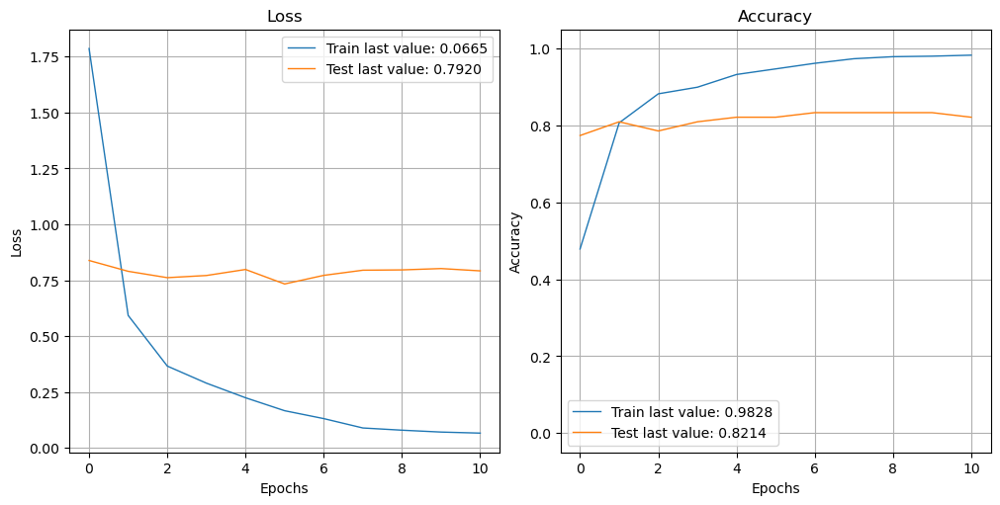

In [46]:
try:
    from plot_keras_history import show_history, plot_history
    import matplotlib.pyplot as plt

    show_history(history1)
    plot_history(history1, path="standard.png")
    plt.close()
except:
    epochs_range = range(11)
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, history1.history['accuracy'], label='Training Accuracy')
    plt.plot(epochs_range, history1.history['val_accuracy'], label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, history1.history['loss'], label='Training Loss')
    plt.plot(epochs_range, history1.history['val_loss'], label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

In [47]:
y_val_pred = np.argmax(model1.predict(X_val), axis=1)
y_val_num = np.argmax(y_val, axis=1)

3/3 [==============================] - 11s 3s/step


In [48]:
conf_mat = confusion_matrix(y_val_num, y_val_pred)
print(conf_mat)

[[10  1  0  2  1  0  0]
 [ 1  8  2  1  0  0  1]
 [ 0  0 11  1  0  0  0]
 [ 0  2  0 12  1  0  0]
 [ 0  0  0  1  5  0  0]
 [ 0  0  1  0  0 11  0]
 [ 0  0  0  0  0  0 12]]


In [49]:
corresp=[0,1,2,3,4,5,6]
y_val_pred_transform = conf_mat_transform(y_val_num, y_val_pred, corresp)
conf_mat = confusion_matrix(y_val_num, y_val_pred_transform)
print(conf_mat)
print()
print(classification_report(y_val_num, y_val_pred_transform))

[[10  1  0  2  1  0  0]
 [ 1  8  2  1  0  0  1]
 [ 0  0 11  1  0  0  0]
 [ 0  2  0 12  1  0  0]
 [ 0  0  0  1  5  0  0]
 [ 0  0  1  0  0 11  0]
 [ 0  0  0  0  0  0 12]]
**************************************************
Correspondance calculée : [0 1 2 3 4 5 6]
Correspondance          : [0, 1, 2, 3, 4, 5, 6]

**************************************************
[[10  1  0  2  1  0  0]
 [ 1  8  2  1  0  0  1]
 [ 0  0 11  1  0  0  0]
 [ 0  2  0 12  1  0  0]
 [ 0  0  0  1  5  0  0]
 [ 0  0  1  0  0 11  0]
 [ 0  0  0  0  0  0 12]]

              precision    recall  f1-score   support

           0       0.91      0.71      0.80        14
           1       0.73      0.62      0.67        13
           2       0.79      0.92      0.85        12
           3       0.71      0.80      0.75        15
           4       0.71      0.83      0.77         6
           5       1.00      0.92      0.96        12
           6       0.92      1.00      0.96        12

    accuracy                      

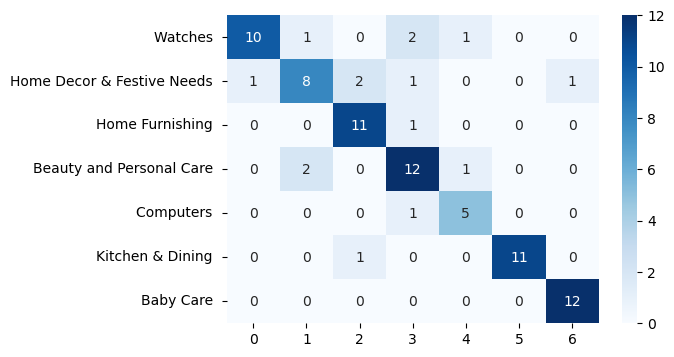

In [52]:
df_cm = pd.DataFrame(conf_mat, index = [label for label in list(set(dfmarket['category1']))],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (6,4))
sns.heatmap(df_cm, annot=True, cmap="Blues");

In [51]:
!pip list>requirements_CNN.txt